In [1]:
import torch
import numpy as np
from preparation import *
from data_utils import *
from transformer_things import *
from torch.utils.data import DataLoader, random_split
from torch.utils.data import Subset
import importlib
import numpy as np
from utils import *
import wandb
import torch.optim as optim
from torch.optim.lr_scheduler import SequentialLR, LinearLR, CosineAnnealingLR

from pos_embed_model import *
import pickle

# paths
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [2]:
load_patches = np.load('/sdf/data/neutrino/carsmith/all_global_norm_patches.npy') # array of shape (2519, 5, 250, 250)
data_list = load_patches.tolist()
dataset = CubeDataset(load_patches)

#DETERMINISTIC!! WILL replicate same samples in each set
val_ratio = 0.1
test_ratio = 0.05
total_size = len(dataset)
val_size = int(total_size * val_ratio)
test_size = int(total_size * test_ratio)
train_size = total_size - val_size - test_size
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size], generator=torch.Generator().manual_seed(42))

batch_size = 64

def custom_collate_fn(batch, mask_percentage=0.6, kernel=12):
    cubes = torch.stack([torch.tensor(cube, dtype=torch.float32) for cube in batch])  # (B, Z, Y, X)
    cubes = cubes.unsqueeze(1)  # (B, 1, Z, Y, X)
    return cubes

test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False,  # don't shuffle for test
    collate_fn=custom_collate_fn,
    num_workers=0,
    pin_memory=False,
    drop_last=False
)

In [3]:
patch_size = (5, 10, 10)
embed_dim = 384
px, py, pz = patch_size
output_dim = px * py * pz
masking_ratio = 0.2 # simple autoencoder test

# all the guys
patch_model = PatchEmbed3D(patch_size=patch_size, embed_dim=embed_dim).to(device)
pos_model = LearnedPositionalEncoder(in_dim=3, embed_dim=embed_dim).to(device)
transformer_encoder = VisionTransformer3D(input_dim=embed_dim).to(device)
transformer_decoder = Decoder(embed_dim=embed_dim, hidden_dim=1024, num_layers=2, output_dim=output_dim, num_heads=4).to(device)

# training params
epochs = 400
model = Model(patch_model, pos_model, transformer_encoder, transformer_decoder, patch_size, embed_dim, output_dim, device, masking_ratio, patch_size)
ckpt = torch.load('/sdf/data/neutrino/carsmith/mae_ckpts/checkpoint_330.pth')
model.load_state_dict(ckpt['model_state_dict'])
model = model.to(device)

/lscratch/carsmith/tmp/ipykernel_1690808/3423862604.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load('/sdf/data/neutrino/carsmith/mae_ckpts/checkpoint_

In [4]:
print(f"number of params: {sum(p.numel() for p in model.parameters() if p.requires_grad)}")

number of params: 27725556


In [5]:
test_loss = final_test(model, test_loader, device, patch_size, batch_size, save_dir = 'stratified_40')

/lscratch/carsmith/tmp/ipykernel_1690808/4078073673.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  cubes = torch.stack([torch.tensor(cube, dtype=torch.float32) for cube in batch])  # (B, Z, Y, X)


/lscratch/carsmith/tmp/ipykernel_1690808/4078073673.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  cubes = torch.stack([torch.tensor(cube, dtype=torch.float32) for cube in batch])  # (B, Z, Y, X)


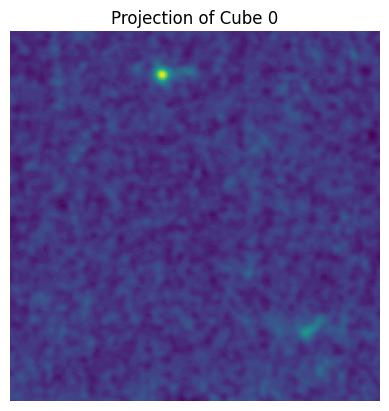

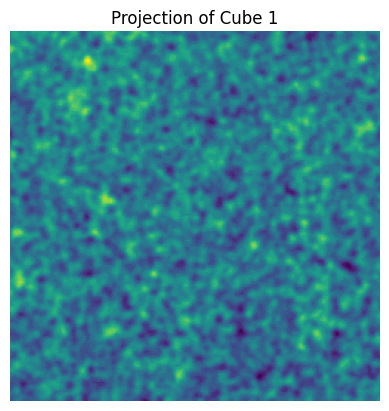

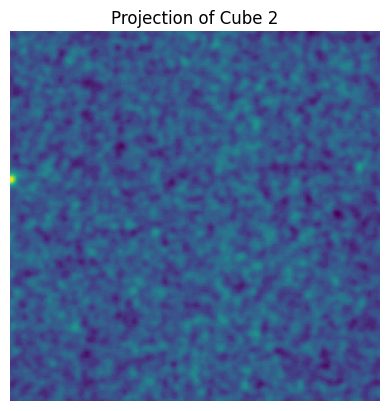

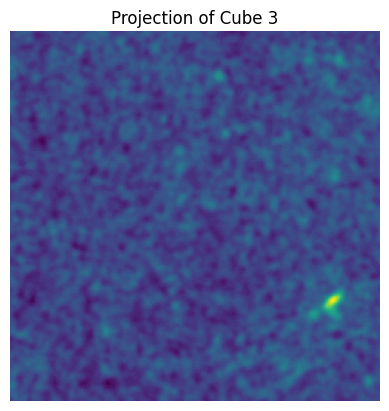

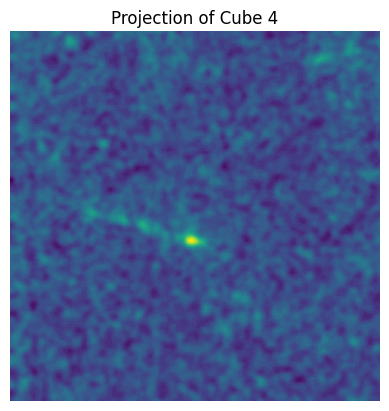

...

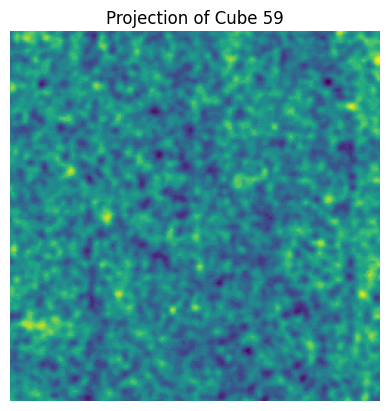

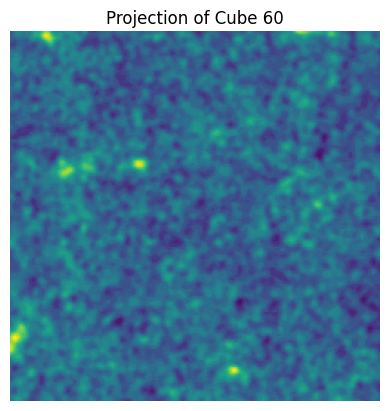

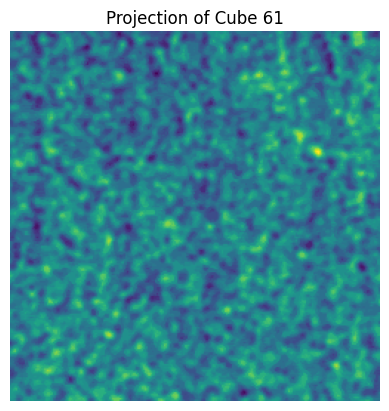

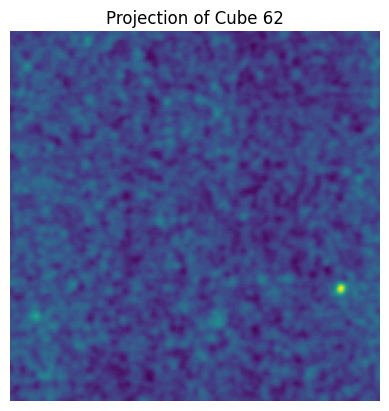

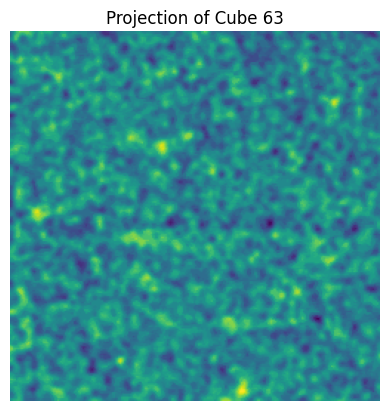

In [6]:
# load_patches = np.load('/sdf/data/neutrino/carsmith/all_global_norm_patches.npy') # array of shape (2519, 5, 250, 250)
# dataset = CubeDataset(load_patches)
cubes = next(iter(test_loader))  # cubes: (B, 1, Z, Y, X)

# Remove channel dimension → (B, Z, Y, X)
cubes = cubes.squeeze(1)

steal = []

for i, cube in enumerate(cubes):  # each cube: (Z, Y, X)
    # if i == 39 or i == 51:
    #     steal.append(cube)
    flat_cube = cube.sum(dim=0)  # sum over Z → shape (Y, X)
    plt.imshow(flat_cube.cpu().numpy(), cmap='viridis')
    plt.title(f"Projection of Cube {i}")
    plt.axis('off')
    plt.show()

# np.save('strong_signal.npy', steal)